# Auto-immune dataset - Milo differential abundance analysis example

Example workflows for more details:

- [Milopy vignette](https://nbviewer.org/github/emdann/milopy/blob/master/notebooks/milopy_example.ipynb)
- [Extended milo example](https://github.com/Teichlab/scripts/blob/main/conditions/extended_milopy_example.ipynb)

In [3]:
import os,sys
import numpy as np
import pandas as pd
import scanpy as sc


In [4]:
import sys
sys.path.append('/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/AIID_notebooks/')

from inflapy.immunoFunc import *

In [5]:
print(sc.__version__)

1.9.1


In [6]:
import milopy.core as milo
import milopy

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import random
import sc_toolbox

import rpy2.rinterface_lib.callbacks
import anndata2ri
import logging

from rpy2.robjects import pandas2ri
from rpy2.robjects import r

sc.settings.verbosity = 0
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

### Load integrated dataset

In [6]:
def load_sub_adata(adata, obs_file):
    obs = pd.read_csv(obs_file, index_col=0)
    if "scvi_clusters" in obs.columns:
        obs.drop(columns="scvi_clusters", inplace=True)
    temp = adata[obs.index].copy()
    temp.obs = obs
    return temp

def load_scvi_outs(adata, emb_file):
    X_scVI_emb = np.load(emb_file)
    X_scVI_umap = np.load(emb_file.rstrip("_scANVI.scVI_out.npy") + "_scANVI.UMAP.npy")
    obs = pd.read_csv(emb_file.rstrip("_scANVI.scVI_out.npy") + "_scANVI.obs.csv", index_col=0)
    adata.obsm["X_scANVI"] = X_scVI_emb
    adata.obsm["X_umap"] = X_scVI_umap
    adata.obs = obs

In [10]:
adata = sc.read_h5ad("/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/B_From_Tissue_Subset_Reintegr_after_label_trans.h5ad")


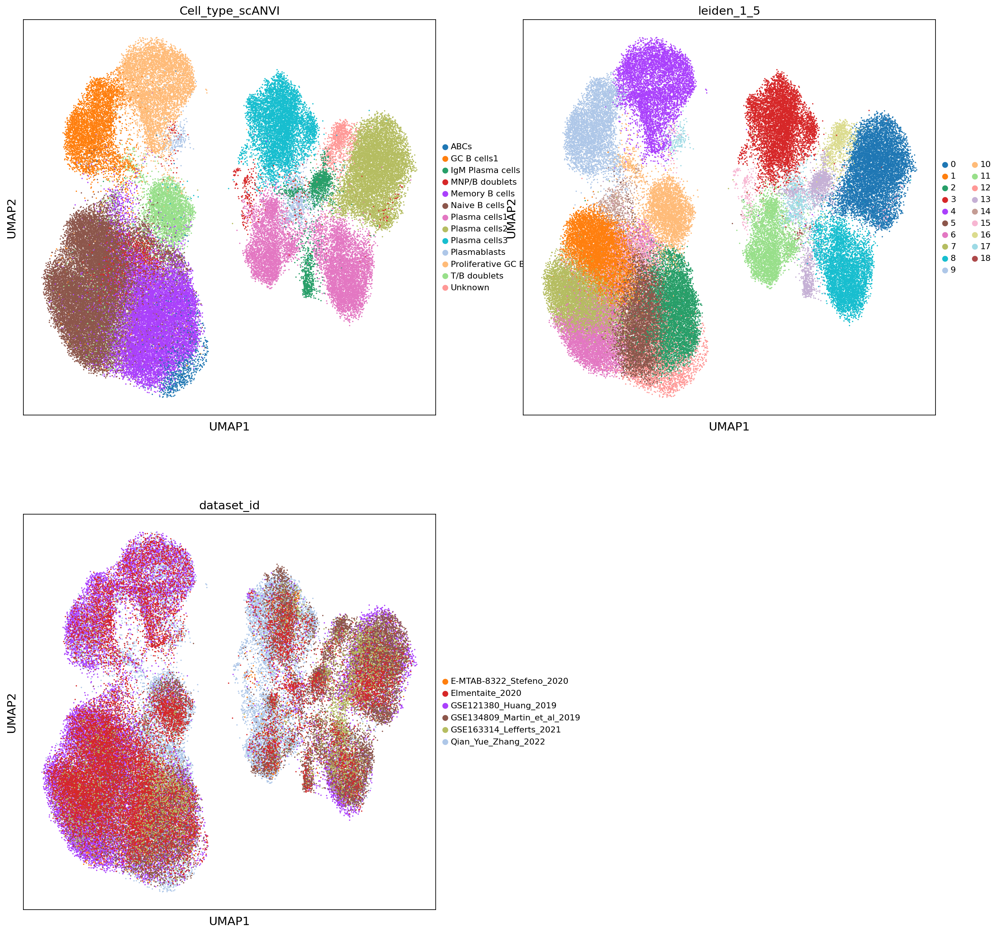

In [11]:
sc.set_figure_params(figsize=(9,9))
sc.pl.umap(
    adata,
    color=["Cell_type_scANVI", "leiden_1_5", "dataset_id"],
    ncols=2,
    frameon=True,
    size=10,
    legend_fontoutline=3,
    legend_fontsize=10,
    #legend_loc="on data",
    cmap='OrRd'

)

In [12]:
adata.obs.dataset_id.value_counts(dropna=False)

GSE121380_Huang_2019           23377
Qian_Yue_Zhang_2022            20099
Elmentaite_2020                18128
GSE134809_Martin_et_al_2019    17550
GSE163314_Lefferts_2021         3157
E-MTAB-8322_Stefeno_2020        1167
Name: dataset_id, dtype: int64

In [13]:
disease_dict = {
    "Crohn's disease":"Crohn's Disease",
    'psoriatic arthritis':'Psoriatic arthritis',
    }

In [14]:
# 
adata.obs['disease'] = (
    adata.obs["disease"]
    .map(lambda x: disease_dict.get(x, x))
    .astype("category")
)

In [15]:
np.unique(adata.obs['disease'])

array(['CD + Spondyloarthritis', "Crohn's Disease",
       'Hashimoto’s thyroiditis', 'Healthy', 'Paediatric IBD',
       'Rheumatoid Arthritis', 'Spondyloarhtritis', 'Uninflamed CD'],
      dtype=object)

In [16]:
adata.obs[['tissue', 'disease']].value_counts().sort_index()

tissue              disease                
Colon               Paediatric IBD             23377
Ileum               Crohn's Disease             9861
                    Uninflamed CD               7689
Retrosigmoid Colon  CD + Spondyloarthritis       947
                    Crohn's Disease              806
                    Healthy                      824
                    Spondyloarhtritis            580
Synovial membrane   Rheumatoid Arthritis        1167
Terminal ileum      Crohn's Disease            10778
                    Healthy                     7350
Thyroid             Hashimoto’s thyroiditis    20099
dtype: int64

In [17]:
tissue_dict = {
    "colon":"Colon",
    'synovial membrane':'Synovial membrane',
    'terminal ileum':'Terminal ileum'
    }

In [18]:
adata.obs['tissue'] = (
    adata.obs["tissue"]
    .map(lambda x: tissue_dict.get(x, x))
    .astype("category")
)

In [19]:
adata.obs.disease.value_counts(dropna=False)

Paediatric IBD             23377
Crohn's Disease            21445
Hashimoto’s thyroiditis    20099
Healthy                     8174
Uninflamed CD               7689
Rheumatoid Arthritis        1167
CD + Spondyloarthritis       947
Spondyloarhtritis            580
Name: disease, dtype: int64

In [20]:
adata.obs.dataset_id.unique()

['Qian_Yue_Zhang_2022', 'GSE121380_Huang_2019', 'E-MTAB-8322_Stefeno_2020', 'GSE134809_Martin_et_al_2019', 'Elmentaite_2020', 'GSE163314_Lefferts_2021']
Categories (6, object): ['E-MTAB-8322_Stefeno_2020', 'Elmentaite_2020', 'GSE121380_Huang_2019', 'GSE134809_Martin_et_al_2019', 'GSE163314_Lefferts_2021', 'Qian_Yue_Zhang_2022']

In [21]:
gc.collect()

37198

In [22]:
adata.obs.disease.value_counts(dropna=False)

Paediatric IBD             23377
Crohn's Disease            21445
Hashimoto’s thyroiditis    20099
Healthy                     8174
Uninflamed CD               7689
Rheumatoid Arthritis        1167
CD + Spondyloarthritis       947
Spondyloarhtritis            580
Name: disease, dtype: int64

In [23]:
adata.obs.Cell_type_scANVI.value_counts(dropna=False)

Naive B cells               21727
Memory B cells              14735
Plasma cells1                9345
Plasma cells2                9061
Plasma cells3                6911
Proliferative GC B cells     6391
GC B cells1                  5140
T/B doublets                 4384
IgM Plasma cells             1695
MNP/B doublets               1241
ABCs                          986
Plasmablasts                  937
Unknown                       925
Name: Cell_type_scANVI, dtype: int64

In [25]:
man_leid(adata=adata, cluster="13", key_added="leiden_1_5", resolution=0.1, neighbors_key='scvi_neighbors')

leiden_R  majority_voting        
13,0      Age-associated B cells        1
          Germinal center B cells      21
          Memory B cells                1
          Naive B cells                 1
          Plasma cells               1088
13,1      Age-associated B cells        0
          Germinal center B cells       1
          Memory B cells                0
          Naive B cells                 0
          Plasma cells                582
Name: majority_voting, dtype: int64

In [26]:
ind1 = np.where(adata.obs.leiden_R.isin(['13,0']))
adata.obs.Cell_type_scANVI=adata.obs.Cell_type_scANVI.astype("str")
adata.obs.Cell_type_scANVI.iloc[ind1] = "IgM plasma cells"

ind1 = np.where(adata.obs.leiden_R.isin(['13,1']))
adata.obs.Cell_type_scANVI=adata.obs.Cell_type_scANVI.astype("str")
adata.obs.Cell_type_scANVI.iloc[ind1] = "Plasma cells1"

adata.obs.Cell_type_scANVI=adata.obs.Cell_type_scANVI.astype("category")

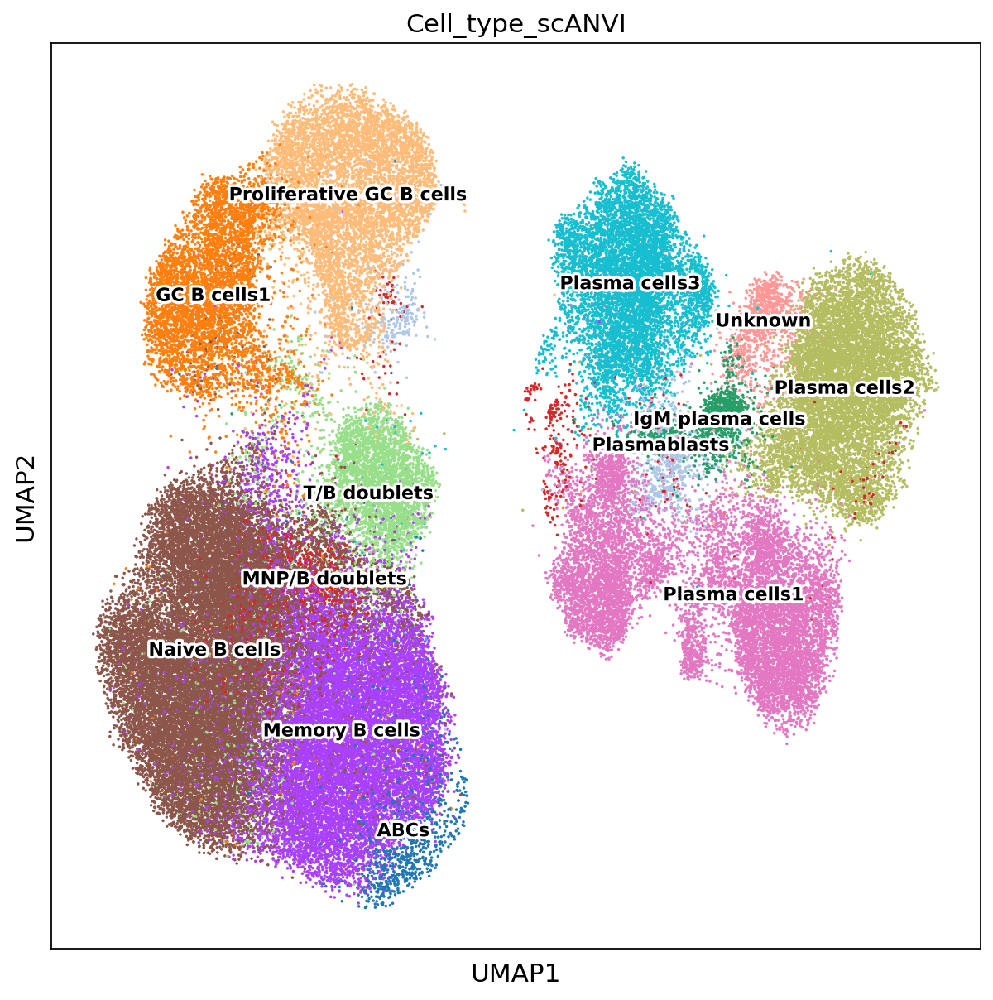

In [27]:
sc.set_figure_params(figsize=(9,9))
sc.pl.umap(
    adata,
    color=["Cell_type_scANVI"],
    ncols=2,
    frameon=True,
    size=10,
    legend_fontoutline=3,
    legend_fontsize=10,
    legend_loc="on data",
    cmap='OrRd'

)

We will keep only donors with average 10 cells in each cluster

In [29]:
adata = adata[adata.obs.Cell_type_scANVI!="Unknown"].copy()

In [30]:
adata.shape

(82553, 18033)

In [31]:
ncel = len(adata.obs.Cell_type_scANVI.unique())

In [32]:
size_by_donor = adata.obs.groupby(["donor_id"]).size()

In [33]:
donors_to_keep = [
    donor
    for donor in size_by_donor.index
    if size_by_donor[donor] >= 10*ncel
]

In [34]:
len(donors_to_keep)

53

In [35]:
len(adata.obs.donor_id.unique())

55

In [36]:
donors_to_keep[:10]

['GSM3972009',
 'GSM3972010',
 'GSM3972013',
 'GSM3972014',
 'GSM3972015',
 'GSM3972016',
 'GSM3972017',
 'GSM3972018',
 'GSM3972019',
 'GSM3972020']

In [37]:
adata = adata[adata.obs["donor_id"].isin(donors_to_keep)]

In [38]:
adata.shape

(82334, 18033)

In [39]:
gc.collect()

3057

In [40]:
adata.obs.disease.value_counts()

Paediatric IBD             23299
Crohn's Disease            20972
Hashimoto’s thyroiditis    20035
Healthy                     8152
Uninflamed CD               7345
Rheumatoid Arthritis        1046
CD + Spondyloarthritis       932
Spondyloarhtritis            553
Name: disease, dtype: int64

In [43]:
dir_save = "/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/"
adata.write_h5ad(dir_save+"scANVI_B_cells_out/B_cell_from_Tissue_scANVI.h5ad")

#adata = sc.read_h5ad(dir_save+"scANVI_B_cells_out/B_cell_from_Tissue_scANVI.h5ad")

In [10]:
sample_cols = ['dataset_id', 'donor_id', 'tissue', 'disease', 'cell_source', 'Cell_type_scANVI']
sample_df = adata.obs[sample_cols].groupby(sample_cols).size().reset_index()
sample_df.columns = sample_cols + ['n_cells']
sample_df = sample_df[sample_df['n_cells'] > 0].copy()
sample_df

,dataset_id,donor_id,tissue,disease,cell_source,Cell_type_scANVI,n_cells
126564,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,ABCs,2
126566,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,IgM plasma cells,6
126567,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,MNP/B doublets,24
126568,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,Memory B cells,3
126570,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,Plasma cells1,28
...,...,...,...,...,...,...,...
1015687,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Plasma cells2,224
1015688,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Plasma cells3,1034
1015689,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Plasmablasts,84
1015690,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Proliferative GC B cells,632


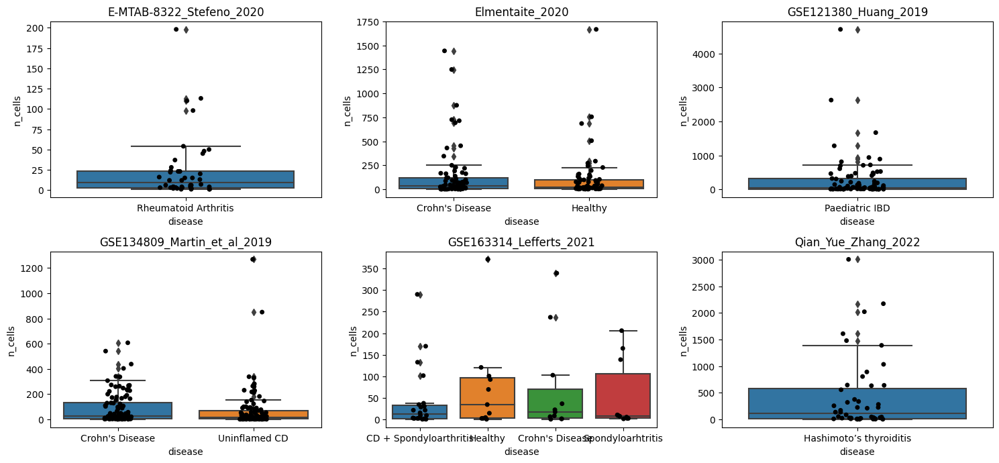

In [13]:
all_datasets = sample_df['dataset_id'].unique()
all_diseases = sample_df['disease'].unique()

with plt.rc_context({'figure.figsize':[15,10]}):
    for i,d in enumerate(all_datasets):
        plt.subplot(3,3,i+1);
        d_df = sample_df[sample_df.dataset_id == d].copy()
        d_df['disease'] = d_df['disease'].astype('str')
        sns.boxplot(
            data = d_df,
            x = 'disease',
            y = 'n_cells'
        );
        sns.stripplot(
            data = d_df,
            x = 'disease',
            y = 'n_cells',
            color = 'black'
        );
        plt.title(d);
    plt.tight_layout()
    plt.show()

Check sample metadata

In [12]:
all_diseases

['Rheumatoid Arthritis', 'Crohn's Disease', 'Healthy', 'Paediatric IBD', 'Uninflamed CD', 'CD + Spondyloarthritis', 'Spondyloarhtritis', 'Hashimoto’s thyroiditis']
Categories (8, object): ['CD + Spondyloarthritis', 'Crohn's Disease', 'Hashimoto’s thyroiditis', 'Healthy', 'Paediatric IBD', 'Rheumatoid Arthritis', 'Spondyloarhtritis', 'Uninflamed CD']

In [14]:
sample_df['disease'].value_counts()

Crohn's Disease            194
Uninflamed CD              108
Paediatric IBD              83
Healthy                     78
Hashimoto’s thyroiditis     48
Rheumatoid Arthritis        42
CD + Spondyloarthritis      22
Spondyloarhtritis           10
Name: disease, dtype: int64

In [15]:
adata.obs.disease.unique()

['Hashimoto’s thyroiditis', 'Paediatric IBD', 'Rheumatoid Arthritis', 'Crohn's Disease', 'Uninflamed CD', 'Healthy', 'CD + Spondyloarthritis', 'Spondyloarhtritis']
Categories (8, object): ['CD + Spondyloarthritis', 'Crohn's Disease', 'Hashimoto’s thyroiditis', 'Healthy', 'Paediatric IBD', 'Rheumatoid Arthritis', 'Spondyloarhtritis', 'Uninflamed CD']

In [16]:
## Rename disease (DA code complains because of weird characters in names)
diseases_short = {
    #'Psoriatic arthritis':'pso_arthritis',#
    'Rheumatoid Arthritis':'RA',
    #'Undifferentiated Arthritis':'Undif_RA',#
    'Paediatric IBD':'Paed_IBD',
    'CD + Spondyloarthritis':"CD_and_spondoarthritis", 
    'Spondyloarhtritis':"spondoarthritis",
    "Crohn's Disease":"CD", 
    'Healthy':'Healthy',
    'Uninflamed CD':'Uninfl_CD',
    'Hashimoto’s thyroiditis':'hashimoto',
    #'Oligoarticular JIA':'Oligo_JIA',#
   #'Osteoarthritis':'OsteoArt'
}
# diseases_short = {v:k for k,v in diseases_short.items()}

In [17]:
adata.obs['disease_short'] = [diseases_short[x] for x in adata.obs['disease']]
# sample_col = 'donor_id'
# condition_col = 'disease'

### Make neighbourhoods

In [51]:
## Make KNN graph for Milo analysis 
k = (sample_df['donor_id'].nunique() * 3) # aim to have 3 cells per donor on avg
sc.pp.neighbors(adata, use_rep='X_scANVI', n_neighbors = k)

In [74]:
milo.make_nhoods(adata, prop=0.1)

In [75]:
len(adata.obs.donor_id.unique())

53

Plot number of cells in neighbourhoods

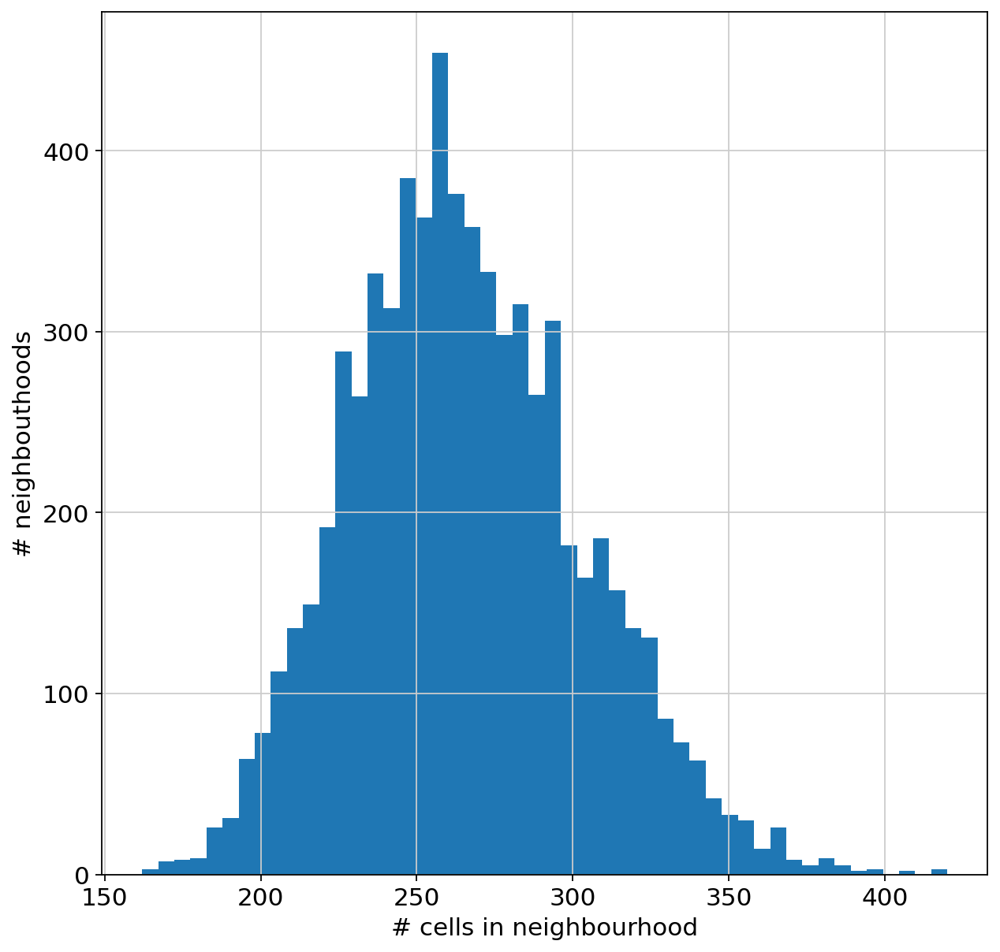

In [76]:
nhood_size = adata.obsm['nhoods'].toarray().sum(0)
plt.hist(nhood_size, bins=50);
plt.xlabel('# cells in neighbourhood');
plt.ylabel('# neighbouthoods');

### Count cells in neighbourhoods

In [77]:
adata.obs['donor_id'] = adata.obs['donor_id'].astype('str') ## Needed for subsetting
milo.count_nhoods(adata, sample_col = 'donor_id')

In [9]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'


#adata.write_h5ad(h5ad_path+'B_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

adata = sc.read_h5ad(h5ad_path+'B_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

In [18]:
sample_cols = ['dataset_id', 'donor_id', 'tissue', 'disease', 'cell_source', 'Cell_type_scANVI']
sample_df = adata.obs[sample_cols].groupby(sample_cols).size().reset_index()
sample_df.columns = sample_cols + ['n_cells']
sample_df = sample_df[sample_df['n_cells'] > 0].copy()

In [19]:
adata

AnnData object with n_obs × n_vars = 82334 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden', 'Cell_type_scANVI', 'leiden_R', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'leiden_1', 'over_clustering'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pct_dropout_by_counts-1-0-0',

In [20]:
import gc
gc.collect()

34

## Run differential abundance test

### 1. Use paired case-controls

For each test restrict to case-control in the same disease

In [21]:
def plot_milo_diagnostics(milo_res):
    '''Function to plot diagnostic plots 
    as in extended vignette https://github.com/Teichlab/scripts/blob/main/conditions/extended_milopy_example.ipynb
    '''
    nhood_adata = adata.uns['nhood_adata'].copy()
    alpha = 0.1 ## significance threshold

    with matplotlib.rc_context({'figure.figsize':[8,8]}):

        ## Check P-value histogram
        plt.subplot(2,2,1);
        plt.hist(milo_res['PValue'], bins=20);
        plt.xlabel('Uncorrected P-value');

        ## Visualize extent of multiple-testing correction
        plt.subplot(2,2,2);
        plt.scatter(milo_res['PValue'], milo_res['SpatialFDR'], s=3);
        plt.xlabel('Uncorrected P-value');
        plt.ylabel('SpatialFDR');

        ## Visualize volcano plot
        plt.subplot(2,2,3);
        plt.scatter(milo_res['logFC'], -np.log10(milo_res['SpatialFDR']), s=3);
        plt.axhline(y=-np.log10(alpha), color='red', linewidth=1, label=f'{int(alpha*100)} % SpatialFDR');
        plt.legend();
        plt.xlabel('log-Fold Change');
        plt.ylabel('- log10(SpatialFDR)');
        plt.tight_layout()

        ## Visualize MA plot
        df = milo_res
        emp_null = df[df['SpatialFDR'] >= alpha]['logFC'].mean()
        df['Sig'] = df['SpatialFDR'] < alpha

        plt.subplot(2,2,4);
        sns.scatterplot(data=df, x="logCPM", y="logFC", hue='Sig')
        plt.axhline(y=0, color='grey', linewidth=1)
        plt.axhline(y=emp_null, color='purple', linewidth=1);
        plt.legend(title=f'< {int(alpha*100)} % SpatialFDR')
        plt.xlabel('Mean log-counts');
        plt.ylabel('log-Fold Change');
        plt.show()
        
def run_DA_autoimmune(adata, sample_df, DA_test_dict):
    '''Wrapper function to run differential abundance testing on autoimmune dataset
    '''
    
    adata.obs['disease_test'] = np.where(adata.obs['disease'].isin(DA_test_dict['disease']), 1, 0)
    
    test_samples = sample_df['donor_id'][sample_df['dataset_id'] == DA_test_dict['dataset_id']].astype('str').values
    
    milo.DA_nhoods(adata, 
                   design="~ donor_id + disease_test",
                   subset_samples=test_samples.tolist()
                  )
    milo_results = adata.uns["nhood_adata"].obs.copy() ## Store results for each disease
    plot_milo_diagnostics(milo_results.dropna())
    return(milo_results)


In [22]:
np.unique(adata.obs.disease)

array(['CD + Spondyloarthritis', "Crohn's Disease",
       'Hashimoto’s thyroiditis', 'Healthy', 'Paediatric IBD',
       'Rheumatoid Arthritis', 'Spondyloarhtritis', 'Uninflamed CD'],
      dtype=object)

In [23]:
adata.obs[["dataset_id", "disease"]].value_counts().sort_index()

dataset_id                   disease                
E-MTAB-8322_Stefeno_2020     Rheumatoid Arthritis        1046
Elmentaite_2020              Crohn's Disease            10720
                             Healthy                     7334
GSE121380_Huang_2019         Paediatric IBD             23299
GSE134809_Martin_et_al_2019  Crohn's Disease             9474
                             Uninflamed CD               7345
GSE163314_Lefferts_2021      CD + Spondyloarthritis       932
                             Crohn's Disease              778
                             Healthy                      818
                             Spondyloarhtritis            553
Qian_Yue_Zhang_2022          Hashimoto’s thyroiditis    20035
dtype: int64

In [24]:
DA_test_res = {}

In [25]:
#for k in DA_test_dict.keys():
  #  print(k)
 #   DA_test_res[k] = run_DA_autoimmune(adata, sample_df, DA_test_dict=DA_test_dict[k])

Comments:

- Except for the Hong dataset, in all other cases there seems to be too little replicates per condition to detect significant differential abundance in this dataset

### 2. Use all healthy as controls

Tricky because we can't control for the batch effect between datasets (for some conditions we don't have data from all the datasets)

In [26]:
diseases_short

{'Rheumatoid Arthritis': 'RA',
 'Paediatric IBD': 'Paed_IBD',
 'CD + Spondyloarthritis': 'CD_and_spondoarthritis',
 'Spondyloarhtritis': 'spondoarthritis',
 "Crohn's Disease": 'CD',
 'Healthy': 'Healthy',
 'Uninflamed CD': 'Uninfl_CD',
 'Hashimoto’s thyroiditis': 'hashimoto'}

In [27]:
milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortCD-disease_shortHealthy'
              )
DA_test_res['all_CD'] = adata.uns['nhood_adata'].obs.copy()

In [28]:
milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortRA-disease_shortHealthy'
              )
DA_test_res['all_RA'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortCD_and_spondoarthritis-disease_shortHealthy'
              )
DA_test_res['all_CD_and_spondoarthritis'] = adata.uns['nhood_adata'].obs.copy()


milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortPaed_IBD-disease_shortHealthy'
              )
DA_test_res['all_Paed_IBD'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortspondoarthritis-disease_shortHealthy'
              )
DA_test_res['all_spondoarthritis'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortUninfl_CD-disease_shortHealthy'
              )
DA_test_res['all_Uninfl_CD'] = adata.uns['nhood_adata'].obs.copy()


milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shorthashimoto-disease_shortHealthy'
              )
DA_test_res['all_hashimoto'] = adata.uns['nhood_adata'].obs.copy()



all_CD


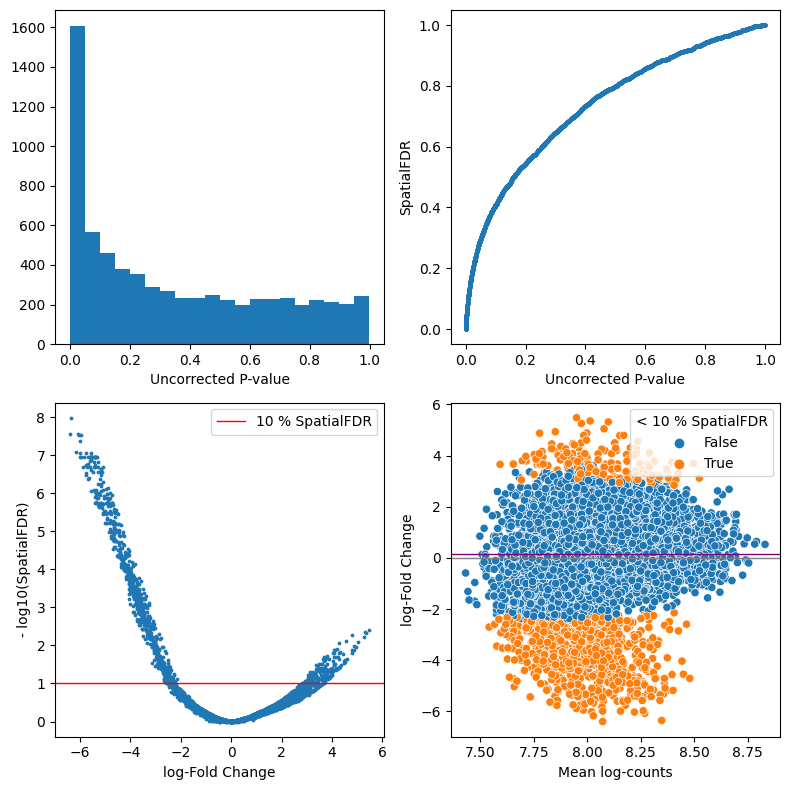

all_RA


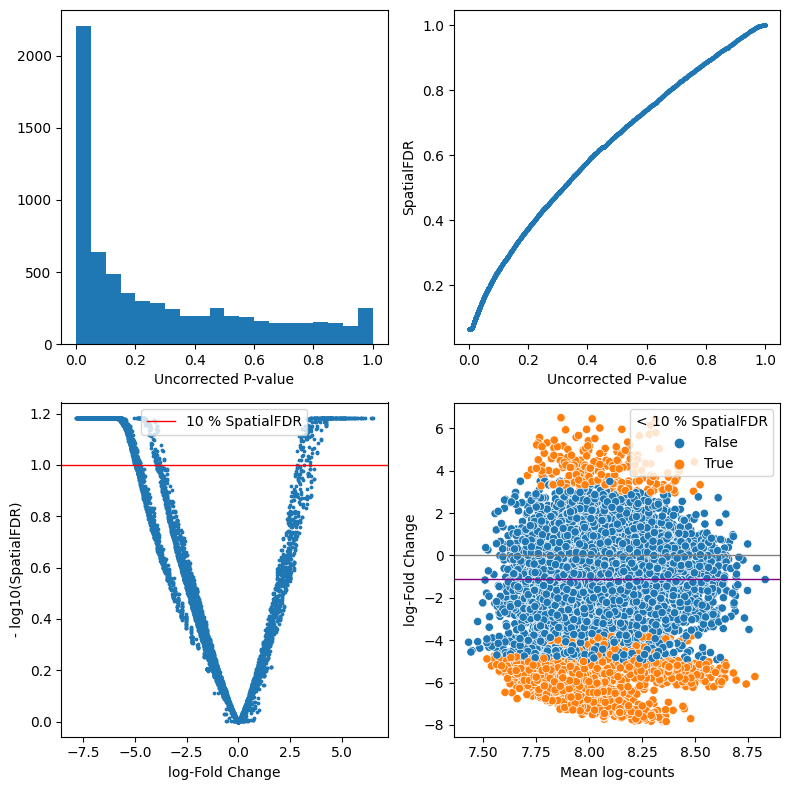

all_CD_and_spondoarthritis


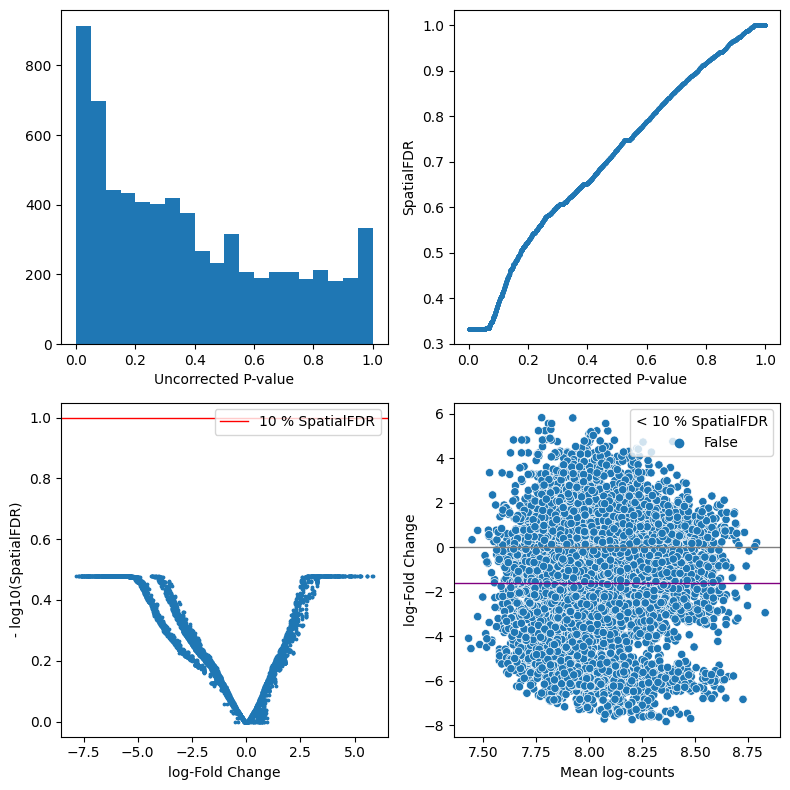

all_Paed_IBD


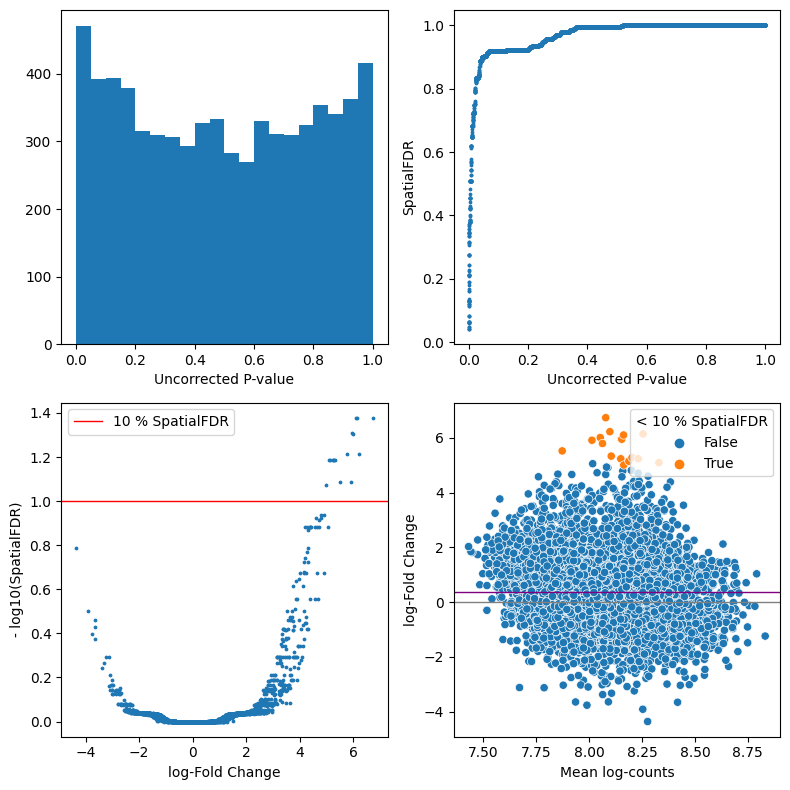

all_spondoarthritis


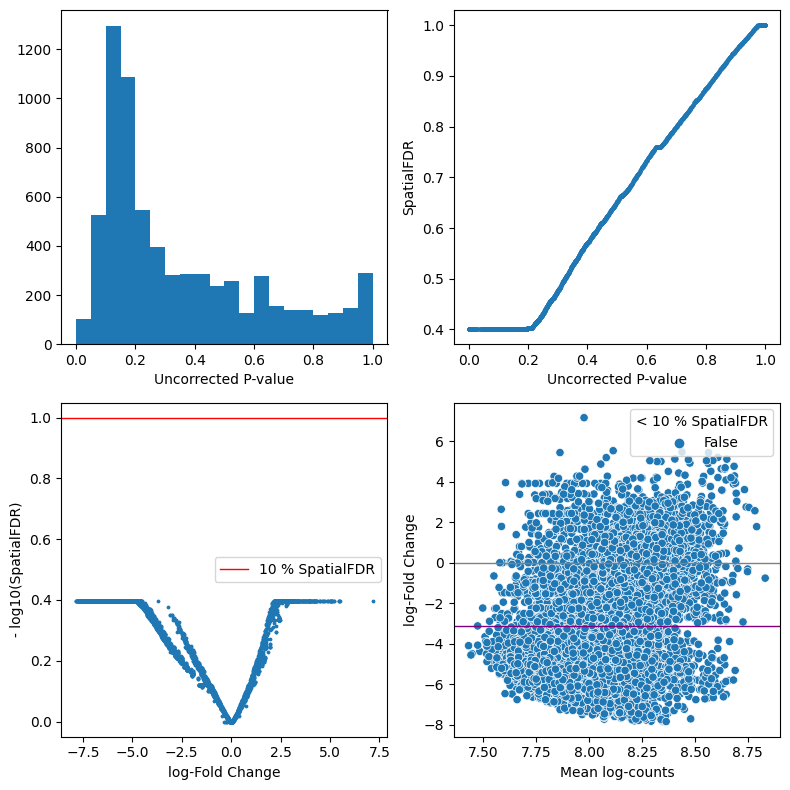

all_Uninfl_CD


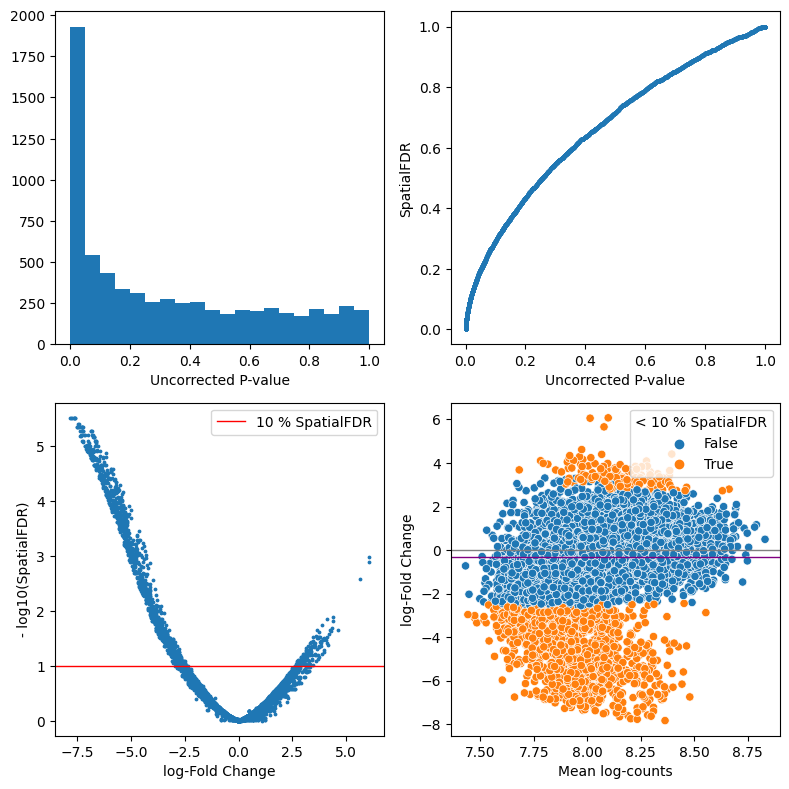

all_hashimoto


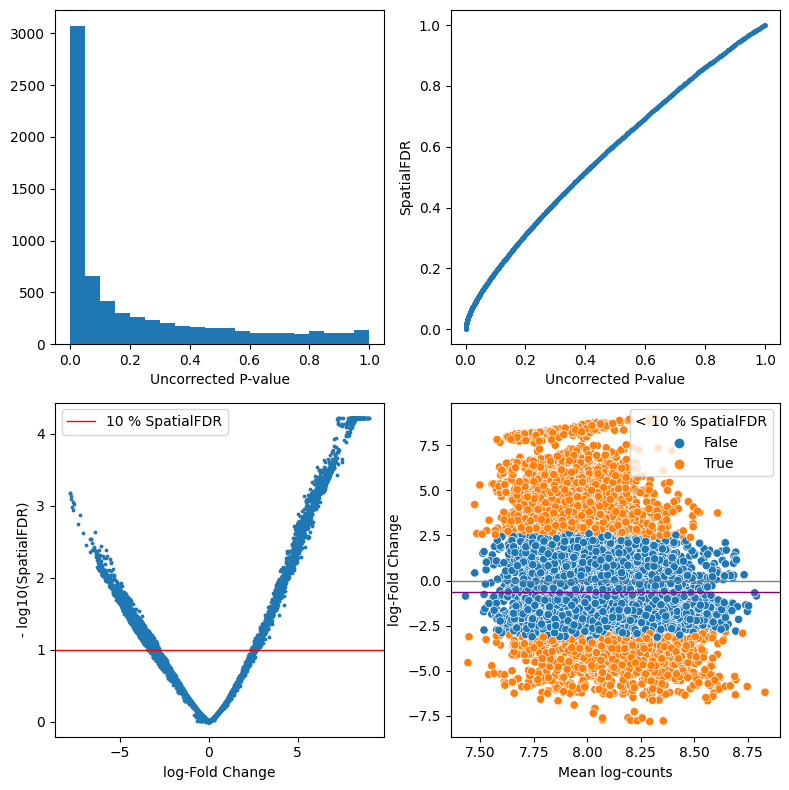

In [29]:
for k in DA_test_res.keys():
    if k.startswith("all_"):
        print(k)
        plot_milo_diagnostics(DA_test_res[k])

Comments:

- In `all_asthma` we see skewed distribution of depleted neighbourhoods (i.e. enriched in Healthy), likely because of the imbalance in number of Healhty and disease donors
- All the others look reasonable in terms of diagnostic statistics, although we might have false positives from batch effects 

## Visualize results by cell type

We select the DA tests where the diagnostic plots look reasonable.

In [40]:
diseases_short

{'Rheumatoid Arthritis': 'RA',
 'Paediatric IBD': 'Paed_IBD',
 'CD + Spondyloarthritis': 'CD_and_spondoarthritis',
 'Spondyloarhtritis': 'spondoarthritis',
 "Crohn's Disease": 'CD',
 'Healthy': 'Healthy',
 'Uninflamed CD': 'Uninfl_CD',
 'Hashimoto’s thyroiditis': 'hashimoto'}

In [41]:
keep_tests = ["all_"+val for val in diseases_short.values() if val not in ["Healthy", "CD_and_spondoarthritis",
                                                                          "spondoarthritis", "Paed_IBD"]]

In [42]:
keep_tests

['all_RA', 'all_CD', 'all_Uninfl_CD', 'all_hashimoto']

Visualize DA logFC on gene expression UMAP

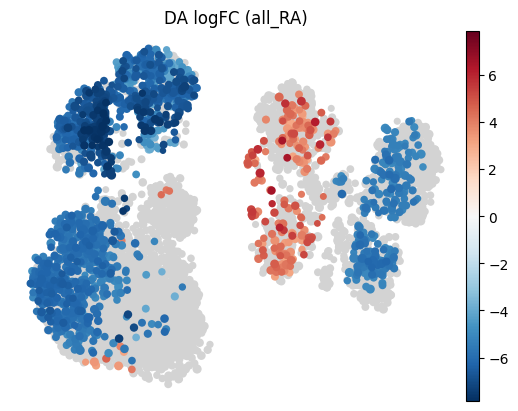

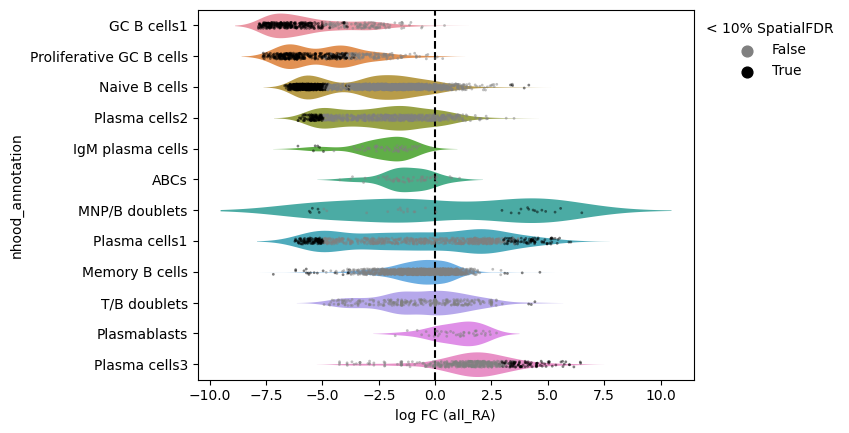

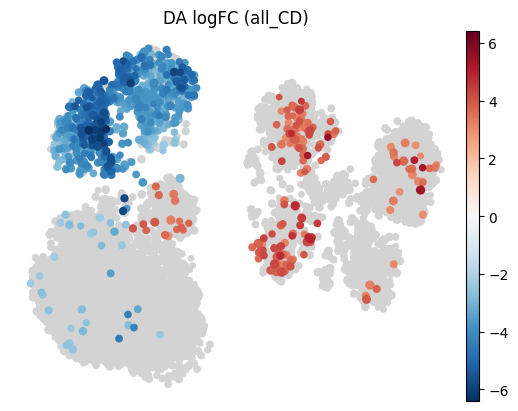

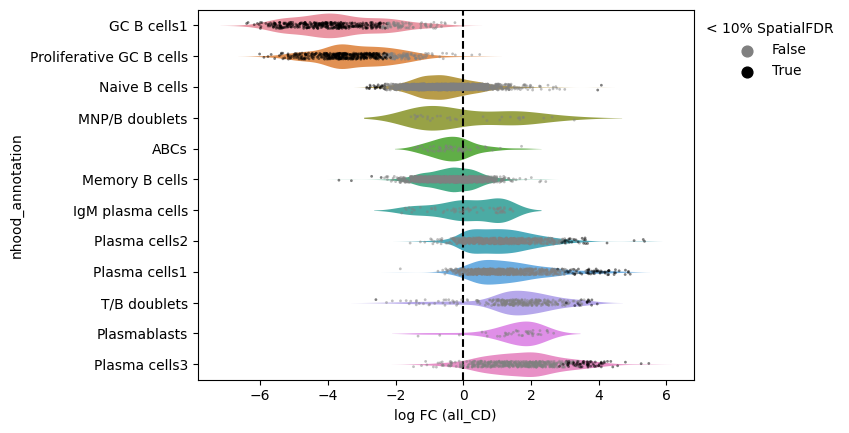

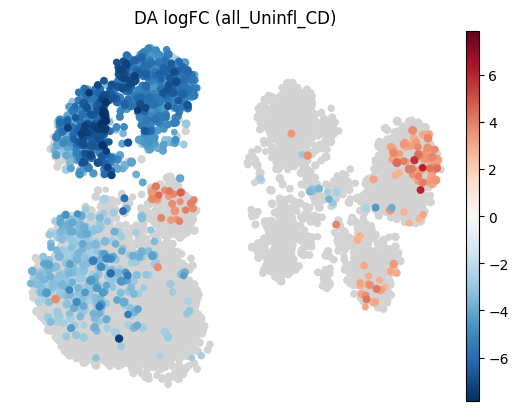

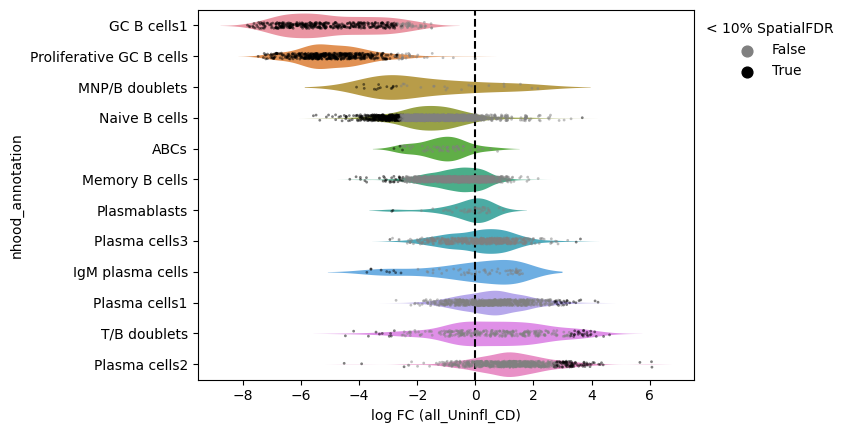

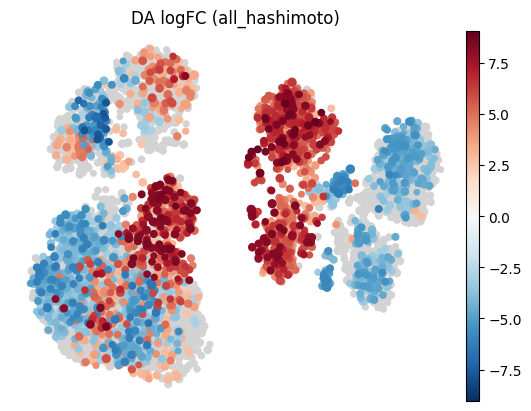

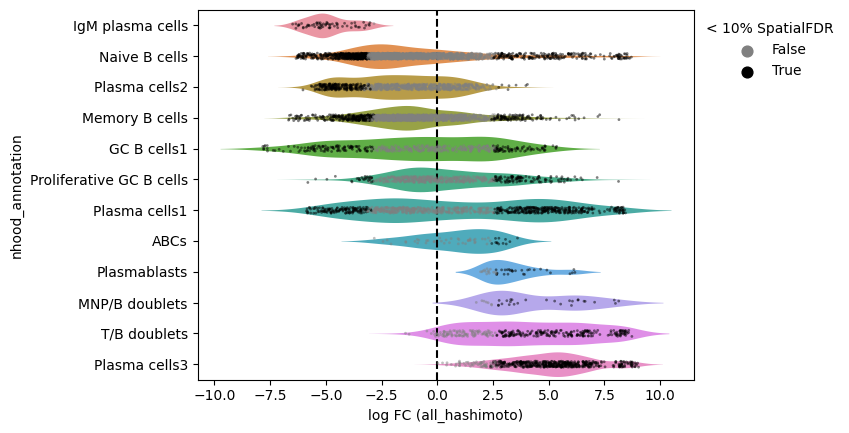

In [43]:
for k in keep_tests:
    
    adata.uns['nhood_adata'].obs = DA_test_res[k].copy()

    ## Plot neighbourhoods on embedding
    milopy.utils.build_nhood_graph(adata)
    milopy.plot.plot_nhood_graph(adata, alpha=0.1, min_size=0.5, title=f'DA logFC ({k})');

    ## Plot by cell type
    milopy.utils.annotate_nhoods(adata, anno_col='Cell_type_scANVI')
    milopy.plot.plot_DA_beeswarm(adata, alpha=0.1);
    plt.xlabel(f'log FC ({k})');
    plt.show()

In [44]:
res_cols = ['logFC', 'SpatialFDR', 'Sig', 'index_cell']

In [45]:
disease_df = []
nhood_annotation = np.array(adata.uns["nhood_adata"].obs['nhood_annotation'])
cell_ind = np.array(adata.uns["nhood_adata"].obs['index_cell'])
for disease in keep_tests:
    
    tab = DA_test_res[disease][res_cols]
    #check if index_cell columns are in the same order
    if any(np.array(adata.uns["nhood_adata"].obs['index_cell']) != tab['index_cell']):
        raise Exception("index_cell don't match...")
    tab["disease"] = np.repeat(disease, tab.shape[0])
    tab["nhood_annotation"] = nhood_annotation
    disease_df.append(tab)

In [46]:
adata.uns["nhood_adata"].obs["Sig"].value_counts()

False    3948
True     2878
Name: Sig, dtype: int64

In [47]:
#Check number of neighbourhoods
disease_df[0]['nhood_annotation'].value_counts()

Naive B cells               2002
Memory B cells              1328
Plasma cells1                791
Plasma cells2                756
Plasma cells3                539
Proliferative GC B cells     493
GC B cells1                  418
T/B doublets                 308
IgM plasma cells              64
ABCs                          52
Plasmablasts                  42
MNP/B doublets                33
Name: nhood_annotation, dtype: int64

In [48]:
compare_disease_df = pd.concat(disease_df)

In [49]:
compare_disease_df.disease.value_counts()

all_RA           6826
all_CD           6826
all_Uninfl_CD    6826
all_hashimoto    6826
Name: disease, dtype: int64

## Save


In [103]:
compare_disease_df.to_csv(h5ad_path+"B_From_Tissue_label_transfer_Milo_3K.csv")

In [104]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'

compare_disease_df = pd.read_csv(h5ad_path+"B_From_Tissue_label_transfer_Milo_3K.csv")

In [105]:
h5ad_path+"B_From_Tissue_label_transfer_Milo_3K.csv"

'/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/B_From_Tissue_label_transfer_Milo_3K.csv'

In [106]:
adata.obs[['Cell_type_scANVI', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance']]

,Cell_type_scANVI,disease_short,nhood_ixs_random,nhood_ixs_refined,nhood_kth_distance
AAACCTGGTAGCACGA-1-1_0_0-0,Plasma cells1,hashimoto,0,0,0.000000
AAACCTGGTCCGAGTC-1_0_0-0,Naive B cells,hashimoto,0,0,0.000000
AAACCTGTCAGTTAGC-1_0_0-0,Naive B cells,hashimoto,0,0,0.000000
AAAGATGTCCTAAGTG-1-1_0_0-0,Plasma cells3,hashimoto,0,0,0.000000
AAAGCAATCTACGAGT-1_0_0-0,T/B doublets,hashimoto,0,0,0.000000
...,...,...,...,...,...
TTTGCGCCACCCATGG-1-1-1-1-1-1-1_1_0_0-1-1,Memory B cells,CD_and_spondoarthritis,0,0,0.000000
TTTGGTTAGAAACCGC-1-1-1-1-1-1-1_1_0_0-1-1,Plasma cells1,CD_and_spondoarthritis,0,0,0.000000
TTTGGTTCATCATCCC-1-1-1-1-1-1-1_1_0_0-1-1,Plasma cells1,CD_and_spondoarthritis,0,0,0.000000
TTTGTCAAGTGGTCCC-1-1-1-1-1-1-1_1_0_0-1-1,Plasma cells2,CD_and_spondoarthritis,0,1,0.811978


In [107]:
gc.collect()

52673

## Milo DEG

In [108]:
adata

AnnData object with n_obs × n_vars = 82334 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden', 'Cell_type_scANVI', 'leiden_R', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'leiden_1', 'over_clustering'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pct_dropout_by_counts-1-0-0',

In [50]:
def nhoo_test_data(adata, dir_fc, cell_type, nhoo_fc, n_disease, dis_pref="all_", disease_label = "disease_short"):
    '''
    Prepare adata for DE testing in neighbourhoods. Cells in neighbourhoods with significant enrichment or depletion in at least two 
    diseases are selected and subsequently used to subset the anndata object.
    
    Params:
    -------
    - nhoo_fc: long format dataframe containing milo testing results of all diseases
    - disease_set: list of two or more diseases in which neighbourhoods are simultaneously depleted or enriched 
    - cell_type: str or list of cell types to test in
    - dir_fc str indicating the direction of the fold abundance (ie depleted or enriched)
    - cell_type_label label of column containing manually annotated
    
    
    
    '''
    
    #selected_nhoo_df = nhoo_fc[(nhoo_fc.disease.isin(disease_set)) & (nhoo_fc.nhood_annotation.isin(cell_type))]
    selected_nhoo_df = nhoo_fc[nhoo_fc.nhood_annotation.isin(cell_type)]

    selected_nhoo_df.reset_index(drop=True, inplace=True)
    #check depletion
    cond1 = ((selected_nhoo_df.logFC < 0) & (selected_nhoo_df.Sig))
    #check enrichment
    cond2 = ((selected_nhoo_df.logFC > 0) & (selected_nhoo_df.Sig))
    
    selected_nhoo_df["dir_FC"] = np.where(cond1, "Depleted", 
        np.where(cond2, "Enriched", "Non_sig"))

    #check the indicated direction of FC and save to test_nhoo column
    selected_nhoo_df["test_nhoo"] = np.where(selected_nhoo_df.dir_FC==dir_fc.capitalize(), True, False)
    
    print("")
    print(f"shape of selected_nhoo_df: {selected_nhoo_df.shape}")
    #transfrom in wide data frame and conserve only nhoo names(index_cell)
    selected_nhoo_df = pd.pivot(selected_nhoo_df, index=['index_cell'], columns="disease", values="test_nhoo")

    #Identify cells that match the condictions in all diseases
    selected_nhoo_df["selected_nhoo"] = selected_nhoo_df.values.sum(axis=1)
    
    #selected_nhoo_df.selected_nhoo.replace([0,1], ["divergent", "shared"], inplace=True)
    selected_nhoo_df["selected_nhoo"] = np.where(selected_nhoo_df.selected_nhoo >= n_disease,
                                                "shared", "rest")
    
    selected_nhoo_df["selected_nhoo"] = selected_nhoo_df.selected_nhoo.astype('category')
    
    print("selected_nhoo_df")
    print(selected_nhoo_df.shape)
    #subset adata to maintain only cells of interest
    adata0 = adata[adata.obs.Cell_type_scANVI.isin(cell_type)].copy()
    print("adata0")
    print(adata0.shape)
    gc.collect()
    #Index of selected cells
    ind_cel = np.array(np.where(adata.obs.Cell_type_scANVI.isin(cell_type))).flatten()
    
    #Select cells that appear in at least one nhoo
        #Shared
    shared_nhoo = selected_nhoo_df.selected_nhoo[selected_nhoo_df.selected_nhoo == "shared"].index #shared index
    
    ind_shared = np.where(adata.uns["nhood_adata"].obs.index_cell.isin(shared_nhoo))
    
    ind_shared = np.array(ind_shared).flatten()
    
    cells_in_nhoods_sh = adata.obsm["nhoods"][:,ind_shared].toarray().sum(1) > 0

    cells_in_nhoods_sh_2 = adata0.obs_names[cells_in_nhoods_sh[ind_cel]]
    
    adata0.obs["nhoo_test_condition"] = np.where(adata0.obs_names.isin(cells_in_nhoods_sh_2), "shared", "rest")
                                            
    print(adata0.obs["nhoo_test_condition"].value_counts())

    return adata0

In [51]:
from IPython.display import display

We run DEG analysis using MAST in R as recommended by https://www.sc-best-practices.org/conditions/differential_gene_expression.html#notes-on-edger

In [52]:
def prep_anndata(adata_):
    def fix_dtypes(adata_):
        df = pd.DataFrame(adata_.X.A, index=adata_.obs_names, columns=adata_.var_names)
        df = df.join(adata_.obs)
        return sc.AnnData(df[adata_.var_names], obs=df.drop(columns=adata_.var_names))

    adata_ = fix_dtypes(adata_)
    sc.pp.filter_genes(adata_, min_cells=10)
    return adata_

## Milo horizontal plot

In [112]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'

compare_disease_df = pd.read_csv(h5ad_path+"B_From_Tissue_label_transfer_Milo_3K.csv", index_col=0)

In [113]:
compare_disease_df

,logFC,SpatialFDR,Sig,index_cell,disease,nhood_annotation
0,1.348692,0.474803,False,AAGGCAGCAAATTGCC-1-1_0_0-0,all_RA,Plasma cells3
1,-3.610836,0.241012,False,ACACCAAAGACGCAAC-1_0_0-0,all_RA,Memory B cells
2,-4.321331,0.147105,False,AGACGTTCAGCCTGTG-1_0_0-0,all_RA,Naive B cells
3,-3.907838,0.189444,False,AGCTCTCAGATCCTGT-1_0_0-0,all_RA,Naive B cells
4,-0.925841,0.696950,False,AGGGTGAAGCAGCGTA-1_0_0-0,all_RA,Memory B cells
...,...,...,...,...,...,...
6821,-1.655953,0.361849,False,TCTCATAGTCTTGCGG-1-1-1-1-1-1-1_1_0_0-1-1,all_hashimoto,Plasma cells2
6822,-4.736621,0.029222,True,TGACTAGAGACTCGGA-1-1-1-1-1-1-1_1_0_0-1-1,all_hashimoto,Plasma cells1
6823,-0.810231,0.622065,False,TGACTAGGTCTAGGTT-1-1-1-1-1-1-1_1_0_0-1-1,all_hashimoto,Plasma cells2
6824,-4.346660,0.031281,True,TTAGGCATCGTGGGAA-1-1-1-1-1-1-1_1_0_0-1-1,all_hashimoto,Plasma cells1


In [118]:
%%R -i compare_disease_df -w 30 -h 12 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/colors.R")
#head(compare_disease_df)

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_horz_plot(nhoo_prep = nhoo_prep, rel_widths = c(0.15, 1, 0.25),
                                anot_bar_height = 0.05, col.pal=vega_20_scanpy,
                                label_size = 35, expand_y_sc = 0.1, 
                                plot.title=element_text(size = 50, face = "bold"))



Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


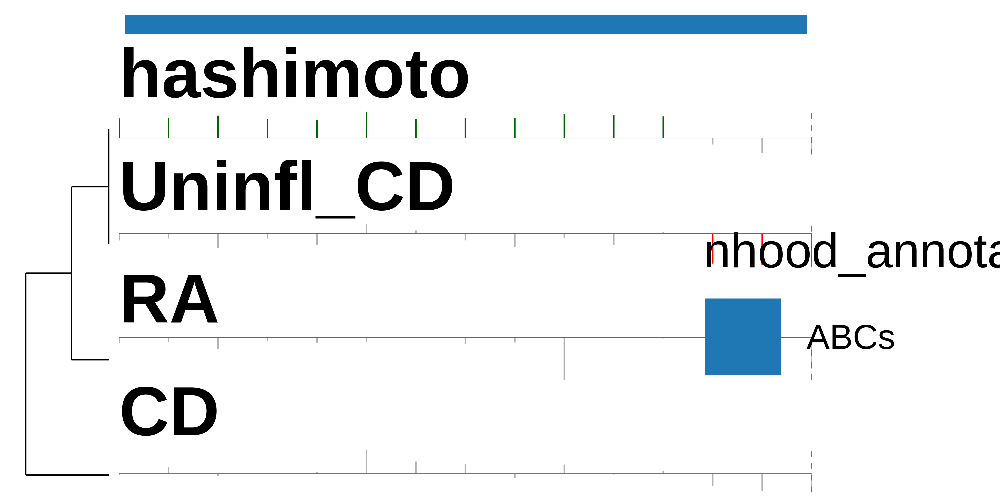

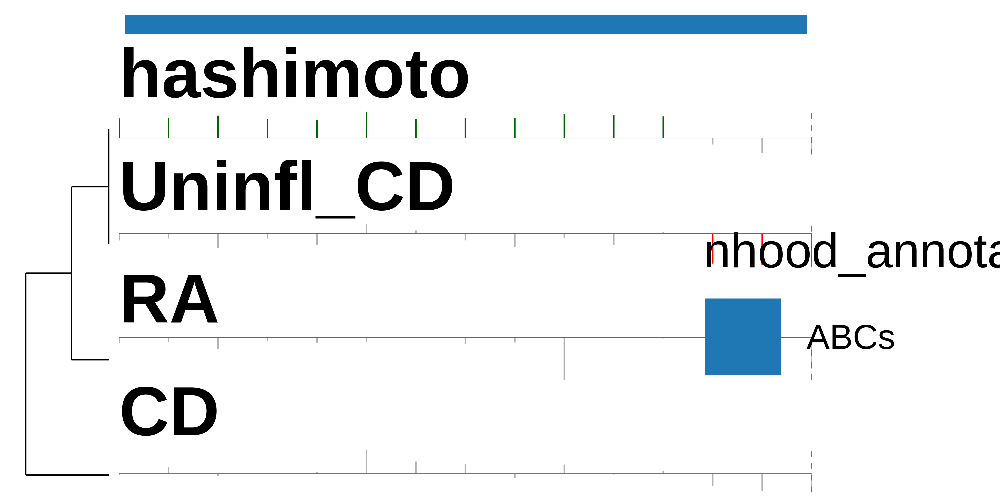

In [121]:
%%R -i compare_disease_df -w 10 -h 5 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)

compare_disease_df = compare_disease_df[compare_disease_df$nhood_annotation=="ABCs",]

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=1,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_horz_plot(nhoo_prep = nhoo_prep, rel_widths = c(0.15, 1, 0.25),
                                anot_bar_height = 0.05, col.pal=vega_20_scanpy,
                                label_size = 35, expand_y_sc = 0.1, 
                                plot.title=element_text(size = 50, face = "bold"))



## Save prepared data


In [82]:
adata.obs.Cell_type_scANVI.value_counts()

Naive B cells               21693
Memory B cells              14690
Plasma cells1                9885
Plasma cells2                9014
Plasma cells3                6881
Proliferative GC B cells     6391
GC B cells1                  5140
T/B doublets                 4379
MNP/B doublets               1237
IgM plasma cells             1108
ABCs                          981
Plasmablasts                  935
Name: Cell_type_scANVI, dtype: int64

In [83]:
#depletion
nhoo_fc=compare_disease_df
n_disease_dict = {
    'GC B cells1':2,
    'Proliferative GC B cells':2,
    'IgM plasma cells':2,
    'Naive B cells':2
}

cell_set = [k for k in n_disease_dict.keys()]

dis_pref="all_"
disease_label = "disease_short"
cell_type_label = "Cell_type_scANVI"
dir_fc = "depleted"
compare_with = True
depl_adatas = []

for cel in cell_set:
    print(f"\n processing {cel}...\n")
    
    test_adata_ = nhoo_test_data(adata=adata, dir_fc = dir_fc, cell_type=[cel], dis_pref="all_", 
                                disease_label = "disease_short", nhoo_fc=compare_disease_df,
                                n_disease = n_disease_dict[cel])

    if(len(test_adata_.obs.nhoo_test_condition.unique()) == 1):
        print(f"Check Category of removed data: {test_adata_.obs.nhoo_test_condition.unique()}")
        continue
    
    print("n_disease")
    print(test_adata_.obs.disease_short.value_counts())
    
    gc.collect()
    depl_adatas.append(test_adata_)
    
    del test_adata_

depleted_adata = depl_adatas[0].concatenate(depl_adatas[1:])


 processing GC B cells1...


shape of selected_nhoo_df: (1672, 8)
selected_nhoo_df
(418, 5)
adata0
(5140, 18033)
shared    5088
rest        52
Name: nhoo_test_condition, dtype: int64
n_disease
Paed_IBD                  2439
hashimoto                 1242
Healthy                   1169
CD                         212
CD_and_spondoarthritis      40
Uninfl_CD                   32
RA                           6
Name: disease_short, dtype: int64

 processing Proliferative GC B cells...


shape of selected_nhoo_df: (1972, 8)
selected_nhoo_df
(493, 5)
adata0
(6391, 18033)
shared    6316
rest        75
Name: nhoo_test_condition, dtype: int64
n_disease
Paed_IBD                  2382
hashimoto                 2160
Healthy                   1294
CD                         488
Uninfl_CD                   37
CD_and_spondoarthritis      19
RA                           8
spondoarthritis              3
Name: disease_short, dtype: int64

 processing IgM plasma cells...


shape of selected_nhoo_df: (256

In [84]:
depleted_adata

AnnData object with n_obs × n_vars = 34332 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden', 'Cell_type_scANVI', 'leiden_R', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'leiden_1', 'over_clustering', 'nhoo_test_condition'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pct_dr

In [85]:
#depleted_adata = prep_anndata(adata_=depleted_adata)

In [86]:
depleted_adata.write_h5ad(h5ad_path+"depleted_nhoo/Tissue_B_depleted_Milo_adata.h5ad")

In [87]:
del depleted_adata

In [88]:
del depl_adatas

#### Enriched

In [89]:
%%R -i compare_disease_df -w 30 -h 12 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_horz_plot(nhoo_prep = nhoo_prep, rel_widths = c(0.15, 1, 0.25),
                                anot_bar_height = 0.05, col.pal=vega_20_scanpy,
                                label_size = 35, expand_y_sc = 0.1, 
                                plot.title=element_text(size = 50, face = "bold"))



Error in plot_milo_with_annot(data = nhoo_prep, condition = disease_clustered[1],  : 
  object 'vega_20_scanpy' not found


In [90]:
adata.obs.Cell_type_scANVI.value_counts()

Naive B cells               21693
Memory B cells              14690
Plasma cells1                9885
Plasma cells2                9014
Plasma cells3                6881
Proliferative GC B cells     6391
GC B cells1                  5140
T/B doublets                 4379
MNP/B doublets               1237
IgM plasma cells             1108
ABCs                          981
Plasmablasts                  935
Name: Cell_type_scANVI, dtype: int64

In [91]:
#Enrichment
gc.collect()

nhoo_fc=compare_disease_df
n_disease_dict = {
    'Plasma cells1':3,
    'Plasma cells3':3
}

cell_set = [k for k in n_disease_dict.keys()]

dis_pref="all_"
disease_label = "disease_short"
cell_type_label = "Cell_type_scANVI"
dir_fc = "enriched"
compare_with = True
enriched_adatas = []

for cel in cell_set:

    cell_type = [cel]
    print(f"\n processing {cel}...\n")

    test_adata = nhoo_test_data(adata=adata, dir_fc = dir_fc, cell_type=cell_type, 
                                dis_pref="all_", disease_label = "disease_short", 
                                nhoo_fc=compare_disease_df, n_disease=n_disease_dict[cel])

    if(len(test_adata.obs.nhoo_test_condition.unique()) == 1):
        print(f"Check Category of removed data: {test_adata.obs.nhoo_test_condition.unique()}")
        continue
    
    print("n_disease")
    print(test_adata.obs.disease_short.value_counts())
    
    enriched_adatas.append(test_adata)

enriched_adata = enriched_adatas[0].concatenate(enriched_adatas[1:])


 processing Plasma cells1...


shape of selected_nhoo_df: (3164, 8)
selected_nhoo_df
(791, 5)
adata0
(9885, 18033)
rest      7501
shared    2384
Name: nhoo_test_condition, dtype: int64
n_disease
hashimoto                 3127
CD                        2884
Uninfl_CD                 1689
Paed_IBD                  1330
Healthy                    386
CD_and_spondoarthritis     168
spondoarthritis            165
RA                         136
Name: disease_short, dtype: int64

 processing Plasma cells3...


shape of selected_nhoo_df: (2156, 8)
selected_nhoo_df
(539, 5)
adata0
(6881, 18033)
shared    3646
rest      3235
Name: nhoo_test_condition, dtype: int64
n_disease
hashimoto                 4298
CD                        1716
Paed_IBD                   287
Uninfl_CD                  225
RA                         192
Healthy                    139
CD_and_spondoarthritis      13
spondoarthritis             11
Name: disease_short, dtype: int64


In [92]:
#enriched_adata = prep_anndata(adata_=enriched_adata)

In [93]:
enriched_adata.write_h5ad(h5ad_path+"enriched_nhoo/Tissue_B_enriched_Milo_adata.h5ad")

In [94]:
del enriched_adata

In [95]:
del test_adata
del enriched_adatas
gc.collect()

3016